In [40]:
import warnings
warnings.filterwarnings('ignore')
import numpy as np
import pandas as pd   
import matplotlib.pyplot as plt

from imblearn.over_sampling import SMOTE
import itertools
import pandas_profiling as pp #3 
from math import ceil #4
import seaborn as sns #5
import plotly.graph_objects as go  #6
import plotly.express as px  #7
from plotly.subplots import make_subplots  #8
from sklearn.model_selection import train_test_split  #9 
from sklearn.metrics import classification_report 
from datasist.structdata import detect_outliers #14 
import matplotlib as mpl #15
from geopy.distance import great_circle#17
from datetime import datetime #18
from scipy import stats #19
from collections import Counter #20
import plotly.figure_factory as ff #21
from geopy.geocoders import Nominatim #22
from category_encoders import BinaryEncoder #23
import sklearn.metrics as sklm 

from sklearn.impute import SimpleImputer  #11
from sklearn.preprocessing import OrdinalEncoder, OneHotEncoder , MinMaxScaler , StandardScaler, RobustScaler #12
from sklearn.linear_model import LinearRegression  #13
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, plot_confusion_matrix , r2_score  ,mean_squared_error , mutual_info_score,roc_auc_score
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier

from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier
from sklearn import svm
from sklearn.ensemble import RandomForestClassifier



#Reading & Ecxploting  Data

df = pd.read_csv('C:/Users/hp/Desktop/Data Science/Final Project/Adult.csv', na_values=['N/A', 'no', ' ?','NaN','No info'])
df.columns  = [i.replace(' ','_') for i in df.columns]
df.columns  = [i.upper() for i in df.columns]
df.head(3)


pd.set_option('mode.chained_assignment',None)
sns.set(rc={'figure.figsize':(12,12)}, font_scale = 1.3)








## Describing Data

In [79]:
df.head(5)
df.tail(5)

,AGE,WORK_CLASS,EDUCATION_NUMBER,MARITAL_STATUS,OCCUPATION,RELATIONSHIP,RACE,SEX,CAPITAL_GAIN,CAPITAL_LOSS,HRS/WEEK,NATIVE_COUNTRY
32556,27,Private,12,Married-civ-spouse,Tech-support,Wife,White,Female,0,0,38,USA
32557,40,Private,9,Married-civ-spouse,Machine-op-inspct,Husband,White,Male,0,0,40,USA
32558,58,Private,9,Widowed,Adm-clerical,Unmarried,White,Female,0,0,40,USA
32559,22,Private,9,Never-married,Adm-clerical,Own-child,White,Male,0,0,20,USA
32560,52,Self-emp-inc,9,Married-civ-spouse,Exec-managerial,Wife,White,Female,15024,0,40,USA


In [42]:
round(((df.isnull().sum())/len(df['AGE']))*100,1) 

AGE                 0.0
WORK_CLASS          5.6
FNLWGT              0.0
EDUCATION           0.0
EDUCATION_NUMBER    0.0
MARITAL_STATUS      0.0
OCCUPATION          5.7
RELATIONSHIP        0.0
RACE                0.0
SEX                 0.0
CAPITAL_GAIN        0.0
CAPITAL_LOSS        0.0
HRS/WEEK            0.0
NATIVE_COUNTRY      1.8
TARGET              0.0
dtype: float64

In [43]:
df.describe(include="O")

,WORK_CLASS,EDUCATION,MARITAL_STATUS,OCCUPATION,RELATIONSHIP,RACE,SEX,NATIVE_COUNTRY,TARGET
count,30725,32561,32561,30718,32561,32561,32561,31978,32561
unique,8,16,7,14,6,5,2,41,2
top,Private,HS-grad,Married-civ-spouse,Prof-specialty,Husband,White,Male,United-States,<=50K
freq,22696,10501,14976,4140,13193,27816,21790,29170,24720


In [44]:
df['TARGET'] = df.TARGET.str.replace('<=50K','0').str.replace('>50K','1')
df['TARGET']=df.TARGET.astype('int')

In [45]:
df.drop(['EDUCATION'], axis=1, inplace=True)
df.dropna(axis=0, inplace= True)

In [46]:
round(((df.isnull().sum())/len(df['AGE']))*100,1)


AGE                 0.0
WORK_CLASS          0.0
FNLWGT              0.0
EDUCATION_NUMBER    0.0
MARITAL_STATUS      0.0
OCCUPATION          0.0
RELATIONSHIP        0.0
RACE                0.0
SEX                 0.0
CAPITAL_GAIN        0.0
CAPITAL_LOSS        0.0
HRS/WEEK            0.0
NATIVE_COUNTRY      0.0
TARGET              0.0
dtype: float64

In [47]:
df.describe(include="O")

,WORK_CLASS,MARITAL_STATUS,OCCUPATION,RELATIONSHIP,RACE,SEX,NATIVE_COUNTRY
count,30162,30162,30162,30162,30162,30162,30162
unique,7,7,14,6,5,2,41
top,Private,Married-civ-spouse,Prof-specialty,Husband,White,Male,United-States
freq,22286,14065,4038,12463,25933,20380,27504


In [48]:
for i in ['WORK_CLASS', 'MARITAL_STATUS','OCCUPATION','NATIVE_COUNTRY', 'RACE','SEX','RELATIONSHIP','WORK_CLASS']:
    print(df[i].unique())
    print(len(df[i].unique()))
    print('___________________________')




[' State-gov' ' Self-emp-not-inc' ' Private' ' Federal-gov' ' Local-gov'
 ' Self-emp-inc' ' Without-pay']
7
___________________________
[' Never-married' ' Married-civ-spouse' ' Divorced'
 ' Married-spouse-absent' ' Separated' ' Married-AF-spouse' ' Widowed']
7
___________________________
[' Adm-clerical' ' Exec-managerial' ' Handlers-cleaners' ' Prof-specialty'
 ' Other-service' ' Sales' ' Transport-moving' ' Farming-fishing'
 ' Machine-op-inspct' ' Tech-support' ' Craft-repair' ' Protective-serv'
 ' Armed-Forces' ' Priv-house-serv']
14
___________________________
[' United-States' ' Cuba' ' Jamaica' ' India' ' Mexico' ' Puerto-Rico'
 ' Honduras' ' England' ' Canada' ' Germany' ' Iran' ' Philippines'
 ' Poland' ' Columbia' ' Cambodia' ' Thailand' ' Ecuador' ' Laos'
 ' Taiwan' ' Haiti' ' Portugal' ' Dominican-Republic' ' El-Salvador'
 ' France' ' Guatemala' ' Italy' ' China' ' South' ' Japan' ' Yugoslavia'
 ' Peru' 'Guam-USVI' ' Scotland' ' Trinadad&Tobago' ' Greece' ' Nicaragua'
 ' Vi

In [49]:
Catego=['WORK_CLASS','MARITAL_STATUS','OCCUPATION','RELATIONSHIP','RACE','SEX','NATIVE_COUNTRY']
Numero=['AGE','EDUCATION_NUMBER','CAPITAL_GAIN', 'CAPITAL_LOSS', 'HRS/WEEK']
for i in Catego:
    fig=px.histogram(data_frame=df, x=i)
    fig.show()

In [50]:
round(((df[df.NATIVE_COUNTRY ==' United-States'].count())/len(df.NATIVE_COUNTRY)*100),1)

AGE                 91.2
WORK_CLASS          91.2
FNLWGT              91.2
EDUCATION_NUMBER    91.2
MARITAL_STATUS      91.2
OCCUPATION          91.2
RELATIONSHIP        91.2
RACE                91.2
SEX                 91.2
CAPITAL_GAIN        91.2
CAPITAL_LOSS        91.2
HRS/WEEK            91.2
NATIVE_COUNTRY      91.2
TARGET              91.2
dtype: float64

In [51]:
l=df[(df.NATIVE_COUNTRY ==' United-States') & (df.TARGET ==0) ].count()['TARGET']
ll=df[(df.NATIVE_COUNTRY ==' United-States') & (df.TARGET ==1) ].count()['TARGET']

l,ll


(20509, 6995)

In [52]:
S=df[(df.NATIVE_COUNTRY !=' United-States') & (df.TARGET ==1) ].count()['TARGET']
SS=df[(df.NATIVE_COUNTRY !=' United-States') & (df.TARGET ==0) ].count()['TARGET']
S,SS

(513, 2145)

In [53]:
round((df[(df.NATIVE_COUNTRY !=' United-States') & (df.TARGET ==1) ].count()['TARGET']/len(df.AGE))*100,1) 

1.7

In [54]:
for i in [' Cuba', ' Jamaica', ' India', ' Mexico', ' Puerto-Rico',' Honduras' ,' England' ,' Canada', ' Germany', ' Iran' ,' Philippines', ' Poland', ' Columbia', ' Cambodia', ' Thailand', ' Ecuador', ' Laos', ' Taiwan', ' Haiti', ' Portugal', ' Dominican-Republic' ,' El-Salvador',' France' ,' Guatemala', ' Italy', ' China', ' South' ,' Japan', ' Yugoslavia',' Peru', ' Outlying-US(Guam-USVI-etc)' ,'Guam-USVI',' Scotland', ' Trinadad&Tobago',' Greece', ' Nicaragua', ' Vietnam', ' Hong', ' Ireland' ,' Hungary',' Holand-Netherlands']:
    df.NATIVE_COUNTRY=df.NATIVE_COUNTRY.str.replace(i,'Other')


df.NATIVE_COUNTRY=df.NATIVE_COUNTRY.str.replace(' United-States','USA')  




In [55]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 30162 entries, 0 to 32560
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   AGE               30162 non-null  int64 
 1   WORK_CLASS        30162 non-null  object
 2   FNLWGT            30162 non-null  int64 
 3   EDUCATION_NUMBER  30162 non-null  int64 
 4   MARITAL_STATUS    30162 non-null  object
 5   OCCUPATION        30162 non-null  object
 6   RELATIONSHIP      30162 non-null  object
 7   RACE              30162 non-null  object
 8   SEX               30162 non-null  object
 9   CAPITAL_GAIN      30162 non-null  int64 
 10  CAPITAL_LOSS      30162 non-null  int64 
 11  HRS/WEEK          30162 non-null  int64 
 12  NATIVE_COUNTRY    30162 non-null  object
 13  TARGET            30162 non-null  int32 
dtypes: int32(1), int64(6), object(7)
memory usage: 3.3+ MB


In [56]:
df.head()

,AGE,WORK_CLASS,FNLWGT,EDUCATION_NUMBER,MARITAL_STATUS,OCCUPATION,RELATIONSHIP,RACE,SEX,CAPITAL_GAIN,CAPITAL_LOSS,HRS/WEEK,NATIVE_COUNTRY,TARGET
0,39,State-gov,77516,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,USA,0
1,50,Self-emp-not-inc,83311,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,USA,0
2,38,Private,215646,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,USA,0
3,53,Private,234721,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,USA,0
4,28,Private,338409,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Other,0


In [57]:
df.describe(include=["int","float"])

,AGE,FNLWGT,EDUCATION_NUMBER,CAPITAL_GAIN,CAPITAL_LOSS,HRS/WEEK,TARGET
count,30162.000000,3.016200e+04,30162.000000,30162.000000,30162.000000,30162.000000,30162.000000
mean,38.437902,1.897938e+05,10.121312,1092.007858,88.372489,40.931238,0.248922
std,13.134665,1.056530e+05,2.549995,7406.346497,404.298370,11.979984,0.432396
min,17.000000,1.376900e+04,1.000000,0.000000,0.000000,1.000000,0.000000
25%,28.000000,1.176272e+05,9.000000,0.000000,0.000000,40.000000,0.000000
50%,37.000000,1.784250e+05,10.000000,0.000000,0.000000,40.000000,0.000000
75%,47.000000,2.376285e+05,13.000000,0.000000,0.000000,45.000000,0.000000
max,90.000000,1.484705e+06,16.000000,99999.000000,4356.000000,99.000000,1.000000


In [58]:
for i in Numero:
    fig=px.histogram(data_frame=df, x=i) 
    fig.show()

In [59]:

print('CAPITAL_GAIN = ',df['CAPITAL_GAIN'].quantile(0.91))    
print('CAPITAL_LOSS = ',df['CAPITAL_LOSS'].quantile(0.91))    
print('HRS/WEEK = ',df['HRS/WEEK'].quantile(0.7))    


CAPITAL_GAIN =  0.0
CAPITAL_LOSS =  0.0
HRS/WEEK =  42.0


In [60]:

print(df.corr()['TARGET'] )

px.imshow(df.corr()) 


AGE                 0.241998
FNLWGT             -0.008957
EDUCATION_NUMBER    0.335286
CAPITAL_GAIN        0.221196
CAPITAL_LOSS        0.150053
HRS/WEEK            0.229480
TARGET              1.000000
Name: TARGET, dtype: float64


In [61]:
def MI(series):
    return mutual_info_score(series, df.TARGET)

df_MI = df[Catego].apply(MI)
df_MI = df_MI.sort_values(ascending=False).to_frame(name='MI')
display(df_MI)

,MI
RELATIONSHIP,0.115186
MARITAL_STATUS,0.109150
OCCUPATION,0.064597
SEX,0.025928
WORK_CLASS,0.011856
RACE,0.005749
NATIVE_COUNTRY,0.000850


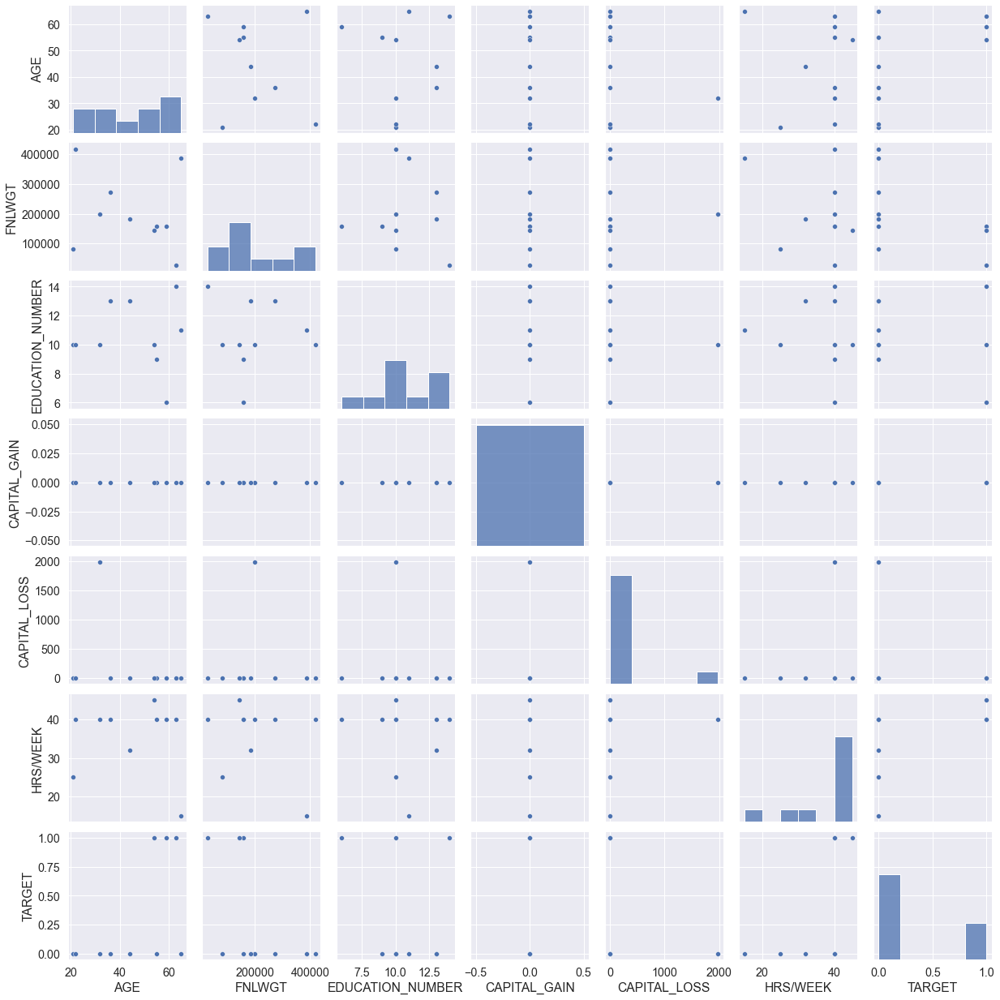

In [62]:
sns.pairplot(df.sample(10))

In [63]:
df.drop(['FNLWGT'], axis=1, inplace=True)
X = df.drop('TARGET', axis=1)
y = df.TARGET
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)



In [64]:
y_train.value_counts()

0    18151
1     5978
Name: TARGET, dtype: int64

In [65]:
y_test.value_counts() 

0    4503
1    1530
Name: TARGET, dtype: int64

In [66]:
Catego_traino =  X_train.select_dtypes(include=['object']).columns
Catego_traino

Index(['WORK_CLASS', 'MARITAL_STATUS', 'OCCUPATION', 'RELATIONSHIP', 'RACE',
       'SEX', 'NATIVE_COUNTRY'],
      dtype='object')

In [67]:
encoder = BinaryEncoder(cols=Catego_traino)
X_train_enc = encoder.fit_transform(X_train)     
X_test_enc = encoder.transform(X_test) 

In [68]:
# Scaling                                                                              
from sklearn.preprocessing import MinMaxScaler                                         
                                                                                       
scaler = MinMaxScaler()                                                                
                                                                                       
X_train_enc[Numero] = scaler.fit_transform(X_train_enc[Numero])
X_test_enc[Numero] = scaler.transform(X_test_enc[Numero])      
                                                                                       

In [69]:
# Hanling imbalanced data
from imblearn.over_sampling import SMOTE

smote = SMOTE(random_state=32)

X_train_sm, y_train_sm = smote.fit_resample(X_train_enc, y_train)

print("After SMOTE:\n",  y_train_sm.value_counts())

After SMOTE:
 0    18151
1    18151
Name: TARGET, dtype: int64


[[4082  421]
 [ 391 1139]]


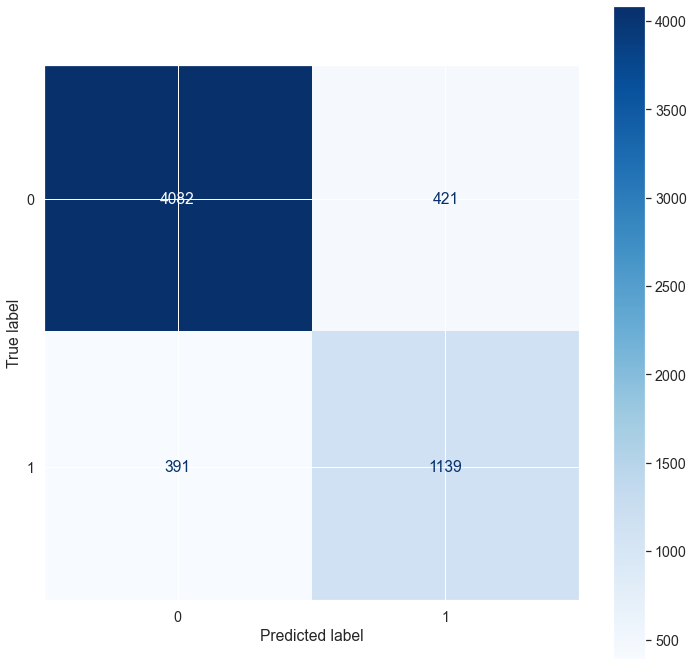

In [70]:
import xgboost as xgb
XGB = xgb.XGBClassifier(random_state=42)

XGB.fit(X_train_sm, y_train_sm)

pred_XGB = XGB.predict(X_test_enc)

print(sklm.confusion_matrix(y_test, pred_XGB))


plot_confusion_matrix(XGB, X_test_enc, y_test, cmap='Blues', values_format='d')


In [71]:
print(classification_report(y_test, pred_XGB))

              precision    recall  f1-score   support

           0       0.91      0.91      0.91      4503
           1       0.73      0.74      0.74      1530

    accuracy                           0.87      6033
   macro avg       0.82      0.83      0.82      6033
weighted avg       0.87      0.87      0.87      6033



In [72]:
Catego=['WORK_CLASS','MARITAL_STATUS','OCCUPATION','RELATIONSHIP','RACE','SEX','NATIVE_COUNTRY']
Numero=['AGE','EDUCATION_NUMBER','CAPITAL_GAIN', 'CAPITAL_LOSS', 'HRS/WEEK']
import pickle

# Save the model as a pickle in a file

filename = 'Adult.pkl'

pickle.dump(XGB, open(filename, 'wb')) 

encoder_filename = 'Adult_Encoder.pkl'
pickle.dump(encoder, open(encoder_filename, 'wb'))

# Save the scaler as a pickle in a file

scaler_filename = 'Adult_Scaler.pkl'
pickle.dump(scaler, open(scaler_filename, 'wb'))

# Load the model from the file




# Loading encoder
encoder = pickle.load(open(encoder_filename, 'rb'))

# Loading scaler
scaler = pickle.load(open(scaler_filename, 'rb'))

# loading the model
model = pickle.load(open(filename, 'rb'))




# A function to transform the user input
def transform_user(user):
    # Transform the user input
    user_enc = encoder.transform(user)
    user_enc[Numero] = scaler.transform(user_enc[Numero])

    return user_enc



In [73]:
df1=df
df1.drop(['TARGET'], axis=1, inplace=True)
user=df1.iloc[10]
user=pd.DataFrame(user).T
user

,AGE,WORK_CLASS,EDUCATION_NUMBER,MARITAL_STATUS,OCCUPATION,RELATIONSHIP,RACE,SEX,CAPITAL_GAIN,CAPITAL_LOSS,HRS/WEEK,NATIVE_COUNTRY
10,37,Private,10,Married-civ-spouse,Exec-managerial,Husband,Black,Male,0,0,80,USA


In [74]:
S=transform_user(user)

In [75]:
L=model.predict(S)

In [76]:
L.dtype

dtype('int32')

In [77]:
pip freeze > requirements.txt

Note: you may need to restart the kernel to use updated packages.


In [78]:
#pip install xgboost